# PADDY DOCTOR 🧑🏻‍⚕️🩺

Download the dataset from 


> https://www.kaggle.com/competitions/paddy-disease-classification/data

There are totally 10 classes

1. `bacterial_leaf_blight` 
2. `bacterial_leaf_streak`
3. `bacterial_panicle_blight` 
4. `blast` 
5. `brown_spot` 
6. `dead_heart`
7. `downy_mildew` 
8. `hispa` 
9. `normal`
10. `tungro`

# Using `kaggle` API to download datasets

## Creating kaggle.json to store the downloaded datsets

In [ ]:
!pip install -q kaggle
from google.colab import files
files.upload()          # expire any previous token(s) and upload recreated token
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list


Saving kaggle.json to kaggle.json
mkdir: cannot create directory ‘/root/.kaggle’: File exists
ref                                                            title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
iamsouravbanerjee/world-population-dataset                     World Population Dataset                             17KB  2022-08-31 11:20:04          12240        355  1.0              
pantanjali/unemployment-dataset                                Unemployment dataset                                 17KB  2022-09-08 08:26:10           4056        104  1.0              
harshsingh2209/tesla-stock-pricing-20172022                    TESLA stock pricing (2017-2022)                      28KB  2022-09-18 14:56:29            884  

## Downloading datasets

In [ ]:
!kaggle competitions download -c paddy-disease-classification  # u need to accept the competition rules to download

 99% 1.01G/1.02G [00:05<00:00, 209MB/s]
100% 1.02G/1.02G [00:06<00:00, 182MB/s]


## Creating directory `data` in which we are going to store the entrire dataset

In [ ]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Unzipping the downloaded datasets

In [ ]:
!unzip paddy-disease-classification.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/train_images/downy_mildew/100992.jpg  
  inflating: data/train_images/downy_mildew/100995.jpg  
  inflating: data/train_images/downy_mildew/101015.jpg  
  inflating: data/train_images/downy_mildew/101020.jpg  
  inflating: data/train_images/downy_mildew/101022.jpg  
  inflating: data/train_images/downy_mildew/101024.jpg  
  inflating: data/train_images/downy_mildew/101034.jpg  
  inflating: data/train_images/downy_mildew/101050.jpg  
  inflating: data/train_images/downy_mildew/101078.jpg  
  inflating: data/train_images/downy_mildew/101096.jpg  
  inflating: data/train_images/downy_mildew/101103.jpg  
  inflating: data/train_images/downy_mildew/101114.jpg  
  inflating: data/train_images/downy_mildew/101119.jpg  
  inflating: data/train_images/downy_mildew/101142.jpg  
  inflating: data/train_images/downy_mildew/101177.jpg  
  inflating: data/train_images/downy_mildew/101178.jpg  
  inflating: data/train_images/downy_

# Downloading `helper_function` from github user : `mrdbrouke`

In [ ]:
!wget https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/helper_functions.py     

--2022-10-01 04:58:52--  https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/helper_functions.py
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘helper_functions.py.1’

helper_functions.py     [ <=>                ] 256.70K  --.-KB/s    in 0.1s    

2022-10-01 04:58:52 (2.48 MB/s) - ‘helper_functions.py.1’ saved [262861]



# Data Visualization

## Importing Necessary libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from IPython.display import Image
from sklearn.model_selection import train_test_split
from matplotlib.pyplot import imread
import tensorflow_hub as hub

In [ ]:
labels = pd.read_csv("data/train.csv")

In [ ]:
labels

,image_id,label,variety,age
0,100330.jpg,bacterial_leaf_blight,ADT45,45
1,100365.jpg,bacterial_leaf_blight,ADT45,45
2,100382.jpg,bacterial_leaf_blight,ADT45,45
3,100632.jpg,bacterial_leaf_blight,ADT45,45
4,101918.jpg,bacterial_leaf_blight,ADT45,45
...,...,...,...,...
10402,107607.jpg,tungro,Zonal,55
10403,107811.jpg,tungro,Zonal,55
10404,108547.jpg,tungro,Zonal,55
10405,110245.jpg,tungro,Zonal,55


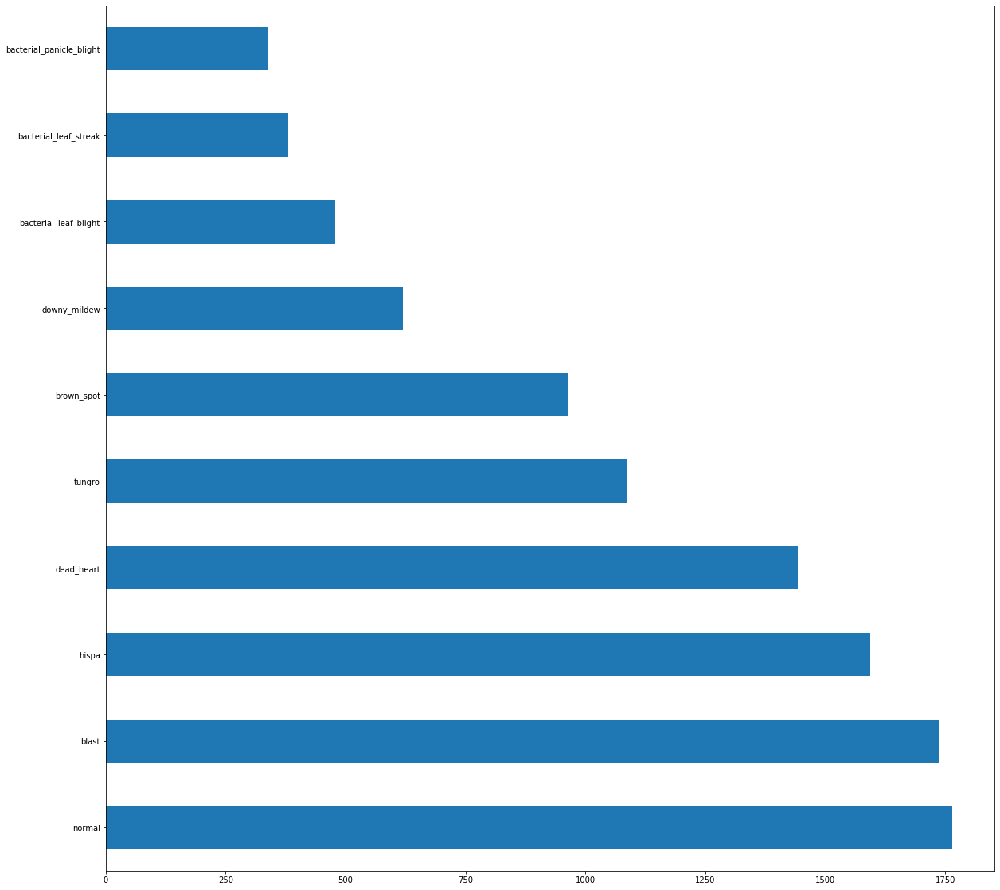

In [ ]:
labels["label"].value_counts().plot.barh(figsize=(20,20))

## Visualizing one image

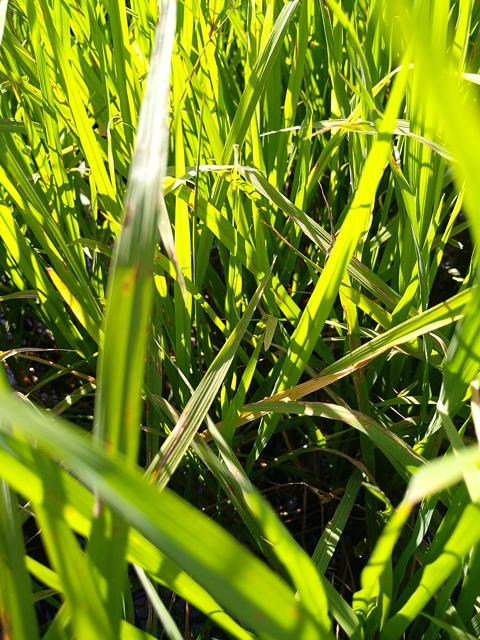

In [ ]:
Image("data/train_images/blast/100004.jpg")

## Creating variable which stores the path directory of the data sets

In [ ]:
# create pathname from labels id
filenames = ["data/train_images/"+ dirname + "/" for dirname in labels["label"]]
filenames = [ filenames[i] + labels['image_id'][i] for i in range(len(labels['image_id']))]  

filenames[:10]

['data/train_images/bacterial_leaf_blight/100330.jpg',
 'data/train_images/bacterial_leaf_blight/100365.jpg',
 'data/train_images/bacterial_leaf_blight/100382.jpg',
 'data/train_images/bacterial_leaf_blight/100632.jpg',
 'data/train_images/bacterial_leaf_blight/101918.jpg',
 'data/train_images/bacterial_leaf_blight/102353.jpg',
 'data/train_images/bacterial_leaf_blight/102848.jpg',
 'data/train_images/bacterial_leaf_blight/103051.jpg',
 'data/train_images/bacterial_leaf_blight/103702.jpg',
 'data/train_images/bacterial_leaf_blight/103920.jpg']

In [ ]:
test_dir = ["data/test_images/"+ dirname + "/" for dirname in labels["label"]]
test_dir = [ filenames[i] + labels['image_id'][i] for i in range(len(labels['image_id']))]

In [ ]:
len(filenames)

10407

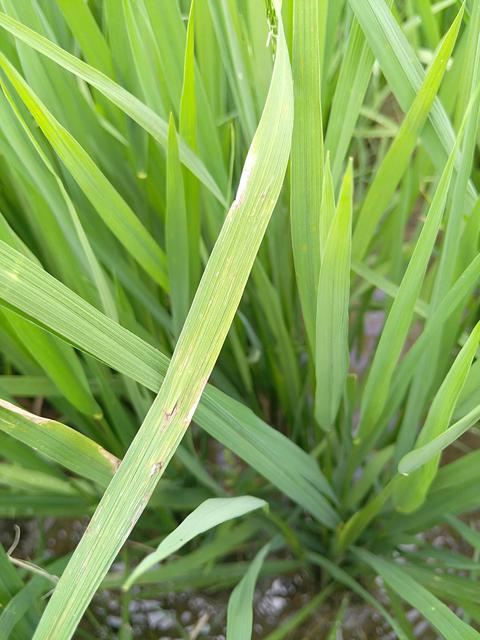

In [ ]:
Image(filenames[2000])

In [ ]:
labels_b = labels["label"]
labels_b = np.array(labels_b)
labels_b , labels_b.shape

(array(['bacterial_leaf_blight', 'bacterial_leaf_blight',
        'bacterial_leaf_blight', ..., 'tungro', 'tungro', 'tungro'],
       dtype=object), (10407,))

In [ ]:
if len(filenames) == len(labels_b):
    print("They are matched : )")
else:
    print("They are not matched :(")

They are matched : )


In [ ]:
# find the unique labels
unique_disease = np.unique(labels_b)
unique_disease

array(['bacterial_leaf_blight', 'bacterial_leaf_streak',
       'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart',
       'downy_mildew', 'hispa', 'normal', 'tungro'], dtype=object)

In [ ]:
# converting a single unique disease to boolean
labels_b[0] == unique_disease

array([ True, False, False, False, False, False, False, False, False,
       False])

In [ ]:
boolean_labels = [label == unique_disease for label in labels_b] # list comprehension
len(boolean_labels)  # for every unique disease we have got arrays of boolean values

10407

In [ ]:
# Example : Turning boolean values into the integers
index = 2000
print(labels_b[index])
print(np.where(unique_disease == labels_b[index]))
print(boolean_labels[index].argmax()) # returns index of the max element
print(boolean_labels[index].astype(int))

blast
(array([3]),)
3
[0 0 0 1 0 0 0 0 0 0]


In [ ]:
# create x and y labels
x = filenames
y = boolean_labels

In [ ]:
# splitting the train and test data set by 80:20 ratio
x_train , x_valid , y_train , y_valid = train_test_split(x,y,test_size=0.2)

len(x_train) , len(x_valid) , len(y_train) , len(y_valid)

(8325, 2082, 8325, 2082)

In [ ]:
x_train[:2] , y_train[:2] , x_valid[:2] , y_valid[:2]

(['data/train_images/dead_heart/100239.jpg',
  'data/train_images/normal/101656.jpg'],
 [array([False, False, False, False, False,  True, False, False, False,
         False]),
  array([False, False, False, False, False, False, False, False,  True,
         False])],
 ['data/train_images/hispa/106358.jpg', 'data/train_images/blast/104006.jpg'],
 [array([False, False, False, False, False, False, False,  True, False,
         False]),
  array([False, False, False,  True, False, False, False, False, False,
         False])])

# PreProcessing Images (turning images into Tensors)

In [ ]:
# convert image into an numpy array
image = imread(filenames[69])

In [ ]:
image , image.shape

(array([[[226, 241, 198],
         [214, 229, 190],
         [206, 219, 189],
         ...,
         [159, 202,  27],
         [156, 197,  30],
         [181, 222,  56]],
 
        [[236, 251, 212],
         [235, 249, 214],
         [223, 236, 210],
         ...,
         [142, 184,  12],
         [151, 192,  25],
         [181, 222,  56]],
 
        [[231, 245, 212],
         [228, 241, 215],
         [209, 221, 201],
         ...,
         [125, 169,   0],
         [142, 185,  17],
         [180, 223,  56]],
 
        ...,
 
        [[ 60,  88,  11],
         [ 66,  95,  15],
         [ 72, 101,  17],
         ...,
         [ 33,  73,   3],
         [ 29,  68,   3],
         [ 30,  69,   6]],
 
        [[ 53,  79,   8],
         [ 57,  85,  11],
         [ 62,  90,  13],
         ...,
         [ 35,  75,   5],
         [ 32,  71,   6],
         [ 31,  70,   5]],
 
        [[ 38,  63,   0],
         [ 44,  71,   0],
         [ 51,  79,   4],
         ...,
         [ 37,  77,   7],
  

In [ ]:
# converting into Tensors
tf.constant(image)

<tf.Tensor: shape=(640, 480, 3), dtype=uint8, numpy=
array([[[226, 241, 198],
        [214, 229, 190],
        [206, 219, 189],
        ...,
        [159, 202,  27],
        [156, 197,  30],
        [181, 222,  56]],

       [[236, 251, 212],
        [235, 249, 214],
        [223, 236, 210],
        ...,
        [142, 184,  12],
        [151, 192,  25],
        [181, 222,  56]],

       [[231, 245, 212],
        [228, 241, 215],
        [209, 221, 201],
        ...,
        [125, 169,   0],
        [142, 185,  17],
        [180, 223,  56]],

       ...,

       [[ 60,  88,  11],
        [ 66,  95,  15],
        [ 72, 101,  17],
        ...,
        [ 33,  73,   3],
        [ 29,  68,   3],
        [ 30,  69,   6]],

       [[ 53,  79,   8],
        [ 57,  85,  11],
        [ 62,  90,  13],
        ...,
        [ 35,  75,   5],
        [ 32,  71,   6],
        [ 31,  70,   5]],

       [[ 38,  63,   0],
        [ 44,  71,   0],
        [ 51,  79,   4],
        ...,
        [ 37,  77,   

In [ ]:
# define image size
IMG_SIZE = 256

def preprocess_image(img_path, img_size=IMG_SIZE):
    """
    Take an image file as an input and convert into the Tensors.
    """
    
    # Read in an image file
    image = tf.io.read_file(img_path)
    
    # Turn the jpeg image into numerical Tensor with 3 color channel (RGB)
    image = tf.image.decode_jpeg(image, channels=3)
    
    # convert the color channels from 0-255 to 0-1
    image = tf.image.convert_image_dtype(image, tf.float32)
    
    # Resize the image to the desired values
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
    
    return image

# Turning our data into the batches of 32

Batches means set of 32 will train at a time and next 32 like wise entire dataset is trained
We mainly use batches system because if we train 10k + images at a tim ethere will be the shortage of the memory of our GPU
So it is very good to train them into the batches 

In order to use Tensorflow effiectively we should use the labels as tuple `(image, label)`

In [ ]:
# Create a simple function

def get_image_label(img_path, labels):
    """
    Takes an image path as an input and return as of them tuple of image and label
    """
    
    image = preprocess_image(img_path)
    
    return image, labels

In [ ]:
preprocess_image(x[42], tf.constant(y[42]))

<tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[0.62935054, 0.7469976 , 0.2685662 ],
        [0.6922182 , 0.8020221 , 0.3353554 ],
        [0.72469366, 0.83057606, 0.37175244],
        ...,
        [0.6517157 , 0.8186888 , 0.08125   ],
        [0.669853  , 0.82524514, 0.07745098],
        [0.7197917 , 0.85704666, 0.11979168]],

       [[0.6840686 , 0.8026961 , 0.3262255 ],
        [0.7261642 , 0.8418505 , 0.37420344],
        [0.7344363 , 0.8452207 , 0.37855396],
        ...,
        [0.6509804 , 0.8171569 , 0.08995099],
        [0.6790441 , 0.8334559 , 0.10183825],
        [0.73406863, 0.8674021 , 0.14816177]],

       [[0.66501224, 0.7937501 , 0.3286765 ],
        [0.7026961 , 0.8330883 , 0.3625    ],
        [0.7113358 , 0.83149517, 0.36023286],
        ...,
        [0.65024513, 0.8140319 , 0.09828432],
        [0.689951  , 0.8384805 , 0.1324755 ],
        [0.7523898 , 0.88180155, 0.19270834]],

       ...,

       [[0.3596201 , 0.57432604, 0.11844364],
        [0.33

In [ ]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to convert the data into the batches
def create_batches(x, y=None, batch_size=BATCH_SIZE,val_data=False, test_data=False):
    """
    Create batches of data of our images (X) and (Y)
    Shuffle the data if it's training data but doesn't shuffle it it's validation data
    Also accepts test data as an input( no labels)
    """
    
    if test_data:
        print("Creating the test Data Batches......")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))  # only filepaths no labels
        data_batch = data.map(preprocess_image).batch(BATCH_SIZE)
    elif val_data:
        print("Creating the valid Data Batches.....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    else:
        print("Creating the Training Data Batches....")

        # Turn filepaths and labels into the Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))

        # Shuffling pathnames and labels before mapping image preprocessor funcion is faster than shuffling images
        data = data.shuffle(buffer_size=len(x))

        # Creata a image, label this will also convert the data preprocessed image
        data = data.map(get_image_label)

        # Turning into the data batches
        data_batch = data.batch(BATCH_SIZE)
    
    return data_batch

In [ ]:
# Create the training and validation data batches
train_data = create_batches(x_train, y_train)
valid_data = create_batches(x_valid, y_valid, val_data=True)

Creating the Training Data Batches....
Creating the valid Data Batches.....


In [ ]:
train_data.element_spec , valid_data.element_spec

((TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)))

In [ ]:
#create a function for viewing the images for the data batches
def show_25_images(image, labels):
    """
    Display a plot of 25 images and their labels from a data batch
    """
    # Setup the figure
    plt.figure(figsize=(10,10))
    # Loop through 25 (for displaying 25 images)
    for i in range(25):
        # Create a subplots ( 5 rows and 5 columns )
        ax = plt.subplot(5 , 5 , i+1)
        # Display an image
        plt.axis("off")
        plt.imshow(image[i])
        # Add the image label as the title
        plt.title(unique_disease[labels[i].argmax()])
        

In [ ]:
unique_disease[y[0].argmax()]

'bacterial_leaf_blight'

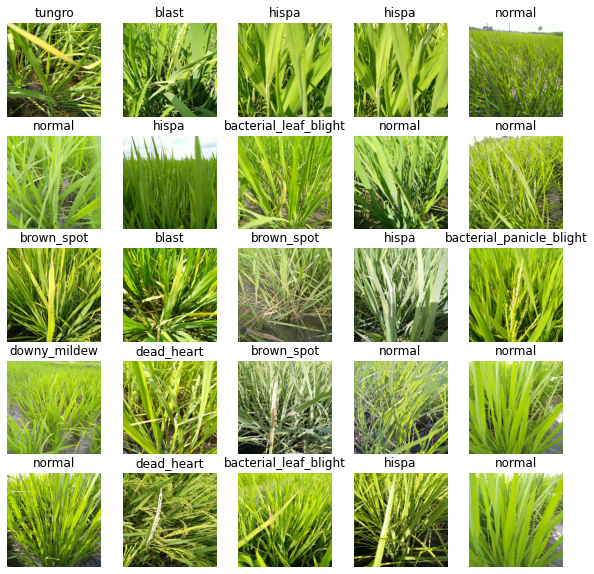

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
# Now let's visualize the data by using the function
show_25_images(train_images, train_labels)

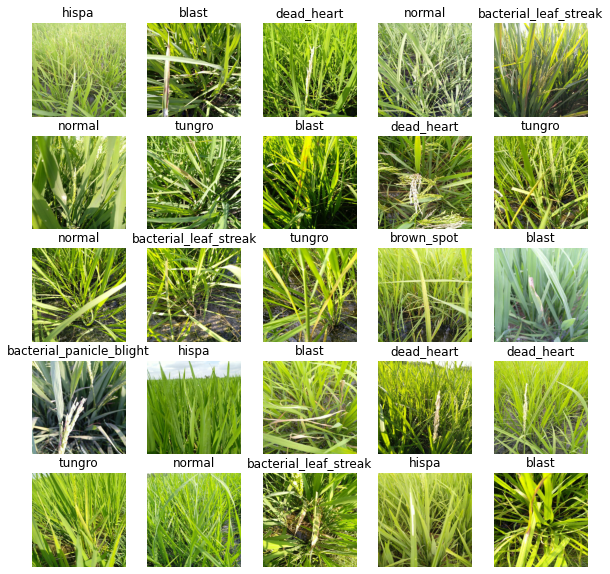

In [ ]:
# now let's visualize the validation data
val_images , val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)


# Building a model
* Before we build a model, there are few things we need to define:
    * The input shape(our images shape , in the form of Tensors) to our model
    * The output shape(image labels, in the form of Tensors) of our model
    * The URL of the model we want to use from Tensorflow hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
len(unique_disease)

10

In [ ]:
# Setup input shape to the model
# INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels
INPUT_SHAPE = (256, 256, 3)
# Setup output shape of our model
OUTPUT_SHAPE = len(unique_disease)

# Setup Model Hub from TensorHub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
import glob
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation, Flatten, Dropout, Dense
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.models import Model
from tensorflow.keras.optimizers import Adam
train_path = "/data/train_images"
n_classes = len(glob.glob(train_path + '/*/'))

def create_model_1(input_shape, n_classes, optimizer='rmsprop', fine_tune=0):
  conv_base = VGG16(include_top=False,
                      weights='imagenet', 
                      input_shape=input_shape)
  if fine_tune > 0:
        for layer in conv_base.layers[:-fine_tune]:
            layer.trainable = False
  else:
        for layer in conv_base.layers:
            layer.trainable = False
  top_model = conv_base.output
  top_model = Flatten(name="flatten")(top_model)
  top_model = Dense(1024, activation='relu')(top_model)
  top_model = Dropout(0.2)(top_model)
    
  output_layer = Dense(n_classes, activation='softmax')(top_model)
  model = Model(inputs=conv_base.input, outputs=output_layer)

  model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
  return model

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from keras import backend as K

INIT_LR = 1e-3
width = 256
height = 256
depth = 3
EPOCHS = 10
def get_model():
    model = Sequential()
    inputShape = (height, width, depth)
    chanDim = -1
    print(K.image_data_format())
    if K.image_data_format() == "channels_first":
        inputShape = (depth, height, width)
        chanDim = 1
    model.add(Conv2D(32, (3, 3), padding="same",input_shape=inputShape))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(MaxPooling2D(pool_size=(3, 3)))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(Conv2D(64, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(Conv2D(128, (3, 3), padding="same"))
    model.add(Activation("relu"))
    model.add(BatchNormalization(axis=chanDim))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1024))
    model.add(Activation("relu"))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(10))
    model.add(Dense(OUTPUT_SHAPE, activation='softmax'))
    
    opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
    # distribution
    model.compile(loss="binary_crossentropy", optimizer=opt,metrics=["accuracy"])
    return model
model = get_model()

channels_last


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
n_classes = 10

In [ ]:
input_shape = (256, 256, 3)

# Use a smaller learning rate
optim_2 = Adam(lr=0.0001)

# Re-compile the model, this time leaving the last 2 layers unfrozen for Fine-Tuning
vgg16_model = create_model_1(input_shape, n_classes, optim_2, fine_tune=2)

def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
    print(f"Building model by using {model_url}")
    
    # Setup the model layers or we can say instantiate the model
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url), # Layer 1 (input layers)
        tf.keras.layers.Dense(units=output_shape,
                             activation="softmax") # Layer 2 (output layers)
    ])
    
    # Compile the model
    
    model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                  optimizer=tf.keras.optimizers.Adam(),
                  metrics=["accuracy"]
                  )
    
    # Build the model
    model.build(input_shape)
    
    return model

In [ ]:
vgg16_model.summary()


Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0  

**Create a function which trains the model**


1. Create a model using `create_model()`
2. Setup a TensorBoard callback using `create_tensor_callback()`
3. Call the `fit()` function on our model passing it the training data , vaidation data, number of epochs to train for ( `NUM_EPOCHS`) and the callbacks we'd like to use.
4. Return the model

In [ ]:
# Builds a function to train and return the trained model
def train_model():
    """
    Trains a given model and returns as the Trained model.
    """
    NUM_EPOCHS = 10
    # Create a model
    model = create_model_1(input_shape, n_classes, optim_2, fine_tune=2)
    
    # Fit the model
    
    model.fit(x=train_data,
             epochs=NUM_EPOCHS,
             validation_data=valid_data,
             validation_freq=1)
    
    # Returning the model
    return model

In [ ]:
model = train_model()

Epoch 1/10
261/261 [==============================] - 88s 279ms/step - loss: 1.0126 - accuracy: 0.6770 - val_loss: 0.5134 - val_accuracy: 0.8329
Epoch 2/10
261/261 [==============================] - 71s 271ms/step - loss: 0.2013 - accuracy: 0.9471 - val_loss: 0.2985 - val_accuracy: 0.9121
Epoch 3/10
261/261 [==============================] - 71s 272ms/step - loss: 0.0712 - accuracy: 0.9837 - val_loss: 0.2946 - val_accuracy: 0.9169
Epoch 4/10
261/261 [==============================] - 71s 272ms/step - loss: 0.0413 - accuracy: 0.9910 - val_loss: 0.2690 - val_accuracy: 0.9241
Epoch 5/10
261/261 [==============================] - 71s 272ms/step - loss: 0.0328 - accuracy: 0.9938 - val_loss: 0.2416 - val_accuracy: 0.9356
Epoch 6/10
261/261 [==============================] - 71s 272ms/step - loss: 0.0240 - accuracy: 0.9953 - val_loss: 0.2602 - val_accuracy: 0.9342
Epoch 7/10
261/261 [==============================] - 70s 270ms/step - loss: 0.0210 - accuracy: 0.9959 - val_loss: 0.2706 - val_ac

In [ ]:
model.evaluate(valid_data)

66/66 [==============================] - 13s 200ms/step - loss: 0.2310 - accuracy: 0.9448


[0.23098710179328918, 0.9447646737098694]

In [ ]:
# make prediction on valid data
predictions_valid_data = model.predict(valid_data, verbose=1)
predictions_valid_data

66/66 [==============================] - 13s 202ms/step


array([[1.6273505e-03, 2.5929417e-04, 1.1965355e-05, ..., 8.9655834e-01,
        1.5324845e-04, 2.1945842e-02],
       [6.3169455e-06, 1.0630360e-03, 4.8418556e-06, ..., 4.2878426e-04,
        1.8026718e-07, 1.5126623e-01],
       [2.5736721e-04, 4.9763958e-08, 5.8130163e-06, ..., 7.6578266e-07,
        3.7688954e-04, 1.5562271e-05],
       ...,
       [3.7421213e-04, 5.5070472e-05, 3.4244996e-04, ..., 1.3796339e-03,
        1.7241567e-02, 4.5546745e-03],
       [1.1175608e-04, 2.7687684e-06, 2.1019994e-06, ..., 9.5481802e-05,
        4.9653267e-05, 6.8508601e-04],
       [2.5650147e-07, 9.9996066e-01, 5.7795974e-06, ..., 6.8976351e-06,
        3.1033883e-06, 2.4098140e-06]], dtype=float32)

In [ ]:
np.sum(predictions_valid_data[0]) , np.sum(predictions_valid_data[1]) , np.sum(predictions_valid_data[2]) , np.sum(predictions_valid_data[3])

(0.99999994, 0.99999994, 0.9999999, 0.99999994)

In [ ]:
# First Predictions
index = 200

print(predictions_valid_data[index])
print(f"MAx value in the predictions is {np.max(predictions_valid_data[index])}")
print(f"Sum of the values is {np.sum(predictions_valid_data[index])}")
print(f"Max value index is {np.argmax(predictions_valid_data[index])}")
print(f"Max value label is {unique_disease[np.argmax(predictions_valid_data[index])]}")

[2.8890959e-04 1.3963541e-05 2.6333038e-05 5.5350288e-06 1.8656536e-04
 8.6262138e-05 2.0064457e-05 2.8033499e-04 9.9903548e-01 5.6612997e-05]
MAx value in the predictions is 0.9990354776382446
Sum of the values is 1.0
Max value index is 8
Max value label is normal


In [ ]:
# Turning the predcitions probablities into there respective labels

def get_pred_labels(predictions_probabilities):
    """
    Truns the predicition probabilities into there respective labels
    """
    
    return unique_disease[np.argmax(predictions_probabilities)]


# Get a prediction label based on the specific index
pred_label = get_pred_labels(predictions_valid_data[69])
pred_label

'bacterial_leaf_streak'

In [ ]:
# create a function to unbatch the data
def unbatchify(batch_data):
    """
    Takes an input of the batch data and return into the unbatched data.
    Note it will return as (images, labels)
    """
    # let's now unbatch the data
    images_ = []
    labels_ = []

    for image, label in batch_data.unbatch().as_numpy_iterator():
        # append into the list
        images_.append(image)
        labels_.append(unique_disease[np.argmax(label)])
    
    return images_, labels_

# now let's unbatchify the batch data
val_images , val_labels = unbatchify(valid_data)

val_labels[0]

'hispa'

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_labels(pred_prob)
    
    
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

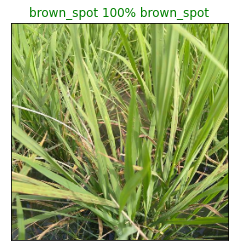

In [ ]:
plot_pred(prediction_probabilities=predictions_valid_data,
          labels=val_labels,
          images=val_images,
          n=99)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_labels(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-11:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_disease[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    #top-plot basically have each bar indexes so argmax return indices of that bar which is true.
  else:
    pass

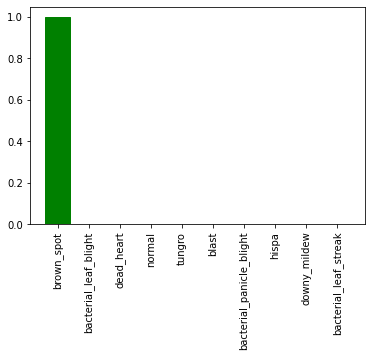

In [ ]:
plot_pred_conf(prediction_probabilities=predictions_valid_data,
                labels=val_labels,
                n=99)

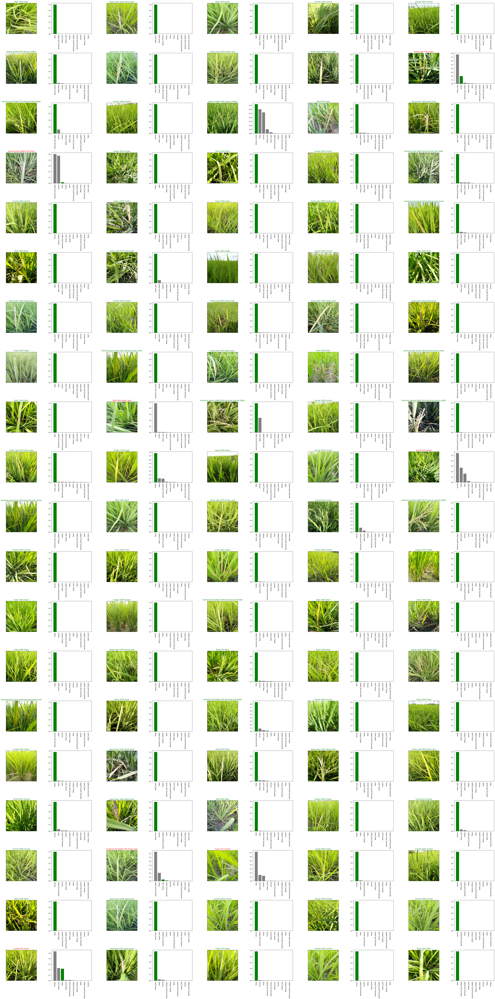

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 30
num_rows = 20
num_cols = 5
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions_valid_data,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions_valid_data,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.savefig('asdsadsad.png', facecolor='w')
plt.show()